In [1]:
import os
if not os.path.exists('Faceswap-Deepfake-Pytorch'):
    !wget -q https://www.dropbox.com/s/5ji7jl7httso9ny/person_images.zip
    !wget -q https://raw.githubusercontent.com/sizhky/deep-fake-util/main/random_warp.py
    !unzip -q person_images.zip
!pip install -q torch_snippets torch_summary
from torch_snippets import *
from random_warp import get_training_data

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.4/65.4 kB 1.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.5/62.5 kB 6.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 203.7/203.7 kB 12.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.3/4.3 MB 52.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 43.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.9/98.9 kB 9.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 77.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 30.6/30.6 MB 39.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.4/169.4 kB 18.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 109.8 MB/s eta 0:00:0

In [2]:
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

In [3]:
def crop_face(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.3, 5)
    if(len(faces)>0):
        for (x,y,w,h) in faces:
            img2 = img[y:(y+h),x:(x+w),:]
        img2 = cv2.resize(img2,(256,256))
        return img2, True
    else:
        return img, False

In [4]:
!mkdir cropped_faces_personA
!mkdir cropped_faces_personB

def crop_images(folder):
    images = Glob(folder+'/*.jpg')
    for i in range(len(images)):
        img = read(images[i],1)
        img2, face_detected = crop_face(img)
        if(face_detected==False):
            continue
        else:
            cv2.imwrite('cropped_faces_'+folder+'/'+str(i)+'.jpg',cv2.cvtColor(img2, cv2.COLOR_RGB2BGR))
crop_images('personA')
crop_images('personB')

In [5]:
class ImageDataset(Dataset):
    def __init__(self, items_A, items_B):
        self.items_A = np.concatenate([read(f,1)[None] for f in items_A])/255.
        self.items_B = np.concatenate([read(f,1)[None] for f in items_B])/255.
        self.items_A += self.items_B.mean(axis=(0, 1, 2)) - self.items_A.mean(axis=(0, 1, 2))

    def __len__(self):
        return min(len(self.items_A), len(self.items_B))
    def __getitem__(self, ix):
        a, b = choose(self.items_A), choose(self.items_B)
        return a, b

    def collate_fn(self, batch):
        imsA, imsB = list(zip(*batch))
        imsA, targetA = get_training_data(imsA, len(imsA))
        imsB, targetB = get_training_data(imsB, len(imsB))
        imsA, imsB, targetA, targetB = [torch.Tensor(i).permute(0,3,1,2).to(device) for i in [imsA, imsB, targetA, targetB]]
        return imsA, imsB, targetA, targetB

a = ImageDataset(Glob('cropped_faces_personA'), Glob('cropped_faces_personB'))
x = DataLoader(a, batch_size=32, collate_fn=a.collate_fn)

══════════════════════════════════════════════════════════════════

tensor([[[[ 5.2587e-01,  5.3707e-01,  5.3414e-01,  ...,  5.6441e-01,
            6.1235e-01,  6.2573e-01],
          [ 5.2509e-01,  5.2310e-01,  5.0373e-01,  ...,  5.7963e-01,
            6.1914e-01,  6.3044e-01],
          [ 5.1311e-01,  4.9901e-01,  4.6604e-01,  ...,  6.0015e-01,
            6.3346e-01,  6.3273e-01],
          ...,
          [ 5.4472e-01,  6.6328e-01,  6.8063e-01,  ...,  5.8913e-01,
            5.6883e-01,  5.5553e-01],
          [ 5.0717e-01,  6.5571e-01,  6.7498e-01,  ...,  5.8160e-01,
            5.6921e-01,  5.6370e-01],
          [ 4.6073e-01,  6.4107e-01,  6.6968e-01,  ...,  5.8168e-01,
            5.7544e-01,  5.7873e-01]],

         [[ 4.3350e-01,  4.4447e-01,  4.4179e-01,  ...,  4.4699e-01,
            4.9515e-01,  5.0261e-01],
          [ 4.3201e-01,  4.2711e-01,  4.1139e-01,  ...,  4.5535e-01,
            4.9490e-01,  5.1065e-01],
          [ 4.1684e-01,  4.0320e-01,  3.7341e-01,  ...,  4.6859e-01,
            5.0313e-01,  5.1293e-01],
          ...,
          [ 4.5794e-01,  5.6028e-01,  5.6144e-01,  ...,  4.3944e-01,
            4.2550e-01,  4.1397e-01],
          [ 4.2570e-01,  5.5520e-01,  5.5614e-01,  ...,  4.3972e-01,
            4.2757e-01,  4.3214e-01],
          [ 3.8033e-01,  5.4316e-01,  5.5180e-01,  ...,  4.4792e-01,
            4.4388e-01,  4.4716e-01]],

         [[ 3.1551e-01,  3.2647e-01,  3.2380e-01,  ...,  3.3628e-01,
            3.8694e-01,  4.0244e-01],
          [ 3.1401e-01,  3.0911e-01,  2.9339e-01,  ...,  3.4928e-01,
            3.9515e-01,  4.0050e-01],
          [ 2.9655e-01,  2.8520e-01,  2.5541e-01,  ...,  3.6525e-01,
            3.9898e-01,  4.0275e-01],
          ...,
          [ 3.9565e-01,  4.9328e-01,  4.9096e-01,  ...,  3.8892e-01,
            3.7809e-01,  3.6598e-01],
          [ 3.6303e-01,  4.8865e-01,  4.8700e-01,  ...,  3.8571e-01,
            3.7960e-01,  3.8081e-01],
          [ 3.2085e-01,  4.7868e-01,  4.8675e-01,  ...,  3.9079e-01,
            3.9255e-01,  3.9584e-01]]],


        [[[ 5.1712e-01,  5.2537e-01,  5.2244e-01,  ...,  5.3014e-01,
            4.5289e-01,  3.9364e-01],
          [ 5.1195e-01,  5.3122e-01,  5.3064e-01,  ...,  5.6992e-01,
            4.9943e-01,  4.2775e-01],
          [ 4.9472e-01,  5.3546e-01,  5.4431e-01,  ...,  6.1417e-01,
            5.5179e-01,  4.8132e-01],
          ...,
          [ 5.0124e-01,  5.9072e-01,  6.1795e-01,  ...,  6.7274e-01,
            6.5669e-01,  6.3260e-01],
          [ 4.4939e-01,  5.6774e-01,  6.1178e-01,  ...,  6.7107e-01,
            6.4462e-01,  6.2124e-01],
          [ 3.7241e-01,  5.3209e-01,  5.8560e-01,  ...,  6.7027e-01,
            6.3771e-01,  6.1505e-01]],

         [[ 4.1816e-01,  4.2518e-01,  4.1284e-01,  ...,  4.1385e-01,
            3.4006e-01,  2.8232e-01],
          [ 4.1177e-01,  4.3006e-01,  4.2381e-01,  ...,  4.4798e-01,
            3.7964e-01,  3.1441e-01],
          [ 3.9474e-01,  4.3396e-01,  4.3628e-01,  ...,  4.9162e-01,
            4.3199e-01,  3.6574e-01],
          ...,
          [ 4.2130e-01,  4.9990e-01,  5.1295e-01,  ...,  5.3726e-01,
            5.1723e-01,  4.9221e-01],
          [ 3.7023e-01,  4.7762e-01,  5.0625e-01,  ...,  5.3534e-01,
            5.0858e-01,  4.8481e-01],
          [ 2.9680e-01,  4.4138e-01,  4.8004e-01,  ...,  5.3470e-01,
            4.9865e-01,  4.7572e-01]],

         [[ 3.1132e-01,  3.1895e-01,  3.0583e-01,  ...,  3.1988e-01,
            2.4895e-01,  1.9209e-01],
          [ 3.0554e-01,  3.2383e-01,  3.1629e-01,  ...,  3.5961e-01,
            2.9302e-01,  2.3102e-01],
          [ 2.8788e-01,  3.2773e-01,  3.2657e-01,  ...,  4.0500e-01,
            3.4626e-01,  2.8363e-01],
          ...,
          [ 3.6445e-01,  4.3590e-01,  4.4869e-01,  ...,  4.5456e-01,
            4.3652e-01,  4.1832e-01],
          [ 3.1934e-01,  4.2079e-01,  4.4710e-01,  ...,  4.5393e-01,
            4.2754e-01,  4.0595e-01],
          [ 2.4496e-01,  3.8517e-01,  4.1922e-01,  ...,  4.6249e-01,
            4.2760e-01,  4.0481e-01]]],


        [[[ 5.5735e-01,  5.8241e-01,  6.12

══════════════════════════════════════════════════════════════════

tensor([[[[0.7824, 0.7919, 0.8092,  ..., 0.4523, 0.4102, 0.3540],
          [0.7812, 0.7871, 0.7980,  ..., 0.4555, 0.4189, 0.3713],
          [0.7658, 0.7771, 0.7883,  ..., 0.4590, 0.4231, 0.3779],
          ...,
          [0.6582, 0.6800, 0.7003,  ..., 0.4522, 0.4311, 0.4229],
          [0.6211, 0.6640, 0.6903,  ..., 0.4412, 0.4317, 0.4156],
          [0.5660, 0.6246, 0.6598,  ..., 0.4271, 0.4286, 0.4039]],

         [[0.6595, 0.6663, 0.6806,  ..., 0.3635, 0.3417, 0.3112],
          [0.6593, 0.6616, 0.6734,  ..., 0.3691, 0.3501, 0.3280],
          [0.6482, 0.6555, 0.6667,  ..., 0.3720, 0.3533, 0.3329],
          ...,
          [0.5731, 0.5779, 0.5905,  ..., 0.3475, 0.3363, 0.3433],
          [0.5364, 0.5656, 0.5819,  ..., 0.3362, 0.3406, 0.3474],
          [0.4923, 0.5372, 0.5585,  ..., 0.3215, 0.3442, 0.3417]],

         [[0.5680, 0.5762, 0.5915,  ..., 0.3111, 0.2953, 0.2700],
          [0.5746, 0.5714, 0.5850,  ..., 0.3159, 0.3005, 0.2848],
          [0.5645, 0.5732, 0.5842,  ..., 0.3195, 0.3060, 0.2879],
          ...,
          [0.4848, 0.4817, 0.4964,  ..., 0.2724, 0.2662, 0.2879],
          [0.4748, 0.4825, 0.4950,  ..., 0.2620, 0.2717, 0.2867],
          [0.4357, 0.4611, 0.4720,  ..., 0.2477, 0.2768, 0.2829]]],


        [[[0.7779, 0.7880, 0.7910,  ..., 0.5064, 0.4842, 0.4551],
          [0.7764, 0.7828, 0.7841,  ..., 0.5171, 0.5013, 0.4642],
          [0.7759, 0.7748, 0.7770,  ..., 0.5215, 0.4996, 0.4645],
          ...,
          [0.7137, 0.7127, 0.6872,  ..., 0.4131, 0.4114, 0.4036],
          [0.7090, 0.7085, 0.6769,  ..., 0.4132, 0.4094, 0.3914],
          [0.6949, 0.6810, 0.6504,  ..., 0.4188, 0.4050, 0.3760]],

         [[0.6681, 0.6782, 0.6812,  ..., 0.4022, 0.3921, 0.3691],
          [0.6666, 0.6730, 0.6743,  ..., 0.4116, 0.3997, 0.3737],
          [0.6661, 0.6645, 0.6672,  ..., 0.4107, 0.3959, 0.3743],
          ...,
          [0.5690, 0.5713, 0.5541,  ..., 0.3681, 0.3827, 0.3857],
          [0.5679, 0.5679, 0.5428,  ..., 0.3817, 0.3896, 0.3816],
          [0.5555, 0.5446, 0.5151,  ..., 0.3997, 0.3950, 0.3721]],

         [[0.5818, 0.5929, 0.5988,  ..., 0.3310, 0.3286, 0.3138],
          [0.5804, 0.5893, 0.5919,  ..., 0.3374, 0.3372, 0.3180],
          [0.5807, 0.5835, 0.5849,  ..., 0.3329, 0.3285, 0.3123],
          ...,
          [0.4663, 0.4716, 0.4563,  ..., 0.3443, 0.3592, 0.3692],
          [0.4671, 0.4735, 0.4471,  ..., 0.3595, 0.3735, 0.3620],
          [0.4605, 0.4481, 0.4229,  ..., 0.3765, 0.3755, 0.3525]]],


        [[[0.3034, 0.2383, 0.2843,  ..., 0.8564, 0.8614, 0.8631],
          [0.2954, 0.2387, 0.2993,  ..., 0.8632, 0.8676, 0.8648],
          [0.2821, 0.2421, 0.3086,  ..., 0.8639, 0.8640, 0.8609],
          ...,
          [0.3916, 0.3926, 0.4001,  ..., 0.6428, 0.6557, 0.6786],
          [0.3834, 0.3959, 0.3901,  ..., 0.6512, 0.6692, 0.6855],
          [0.3592, 0.3941, 0.3872,  ..., 0.6721, 0.6827, 0.6902]],

         [[0.2677, 0.2026, 0.2442,  ..., 0.7191, 0.7242, 0.7259],
          [0.2464, 0.1974, 0.2608,  ..., 0.7336, 0.7365, 0.7310],
          [0.2332, 0.2050, 0.2732,  ..., 0.7348, 0.7346, 0.7314],
          ...,
          [0.3338, 0.3215, 0.3149,  ..., 0.5173, 0.5349, 0.5609],
          [0.3263, 0.3298, 0.3105,  ..., 0.5332, 0.5515, 0.5685],
          [0.3111, 0.3291, 0.3086,  ..., 0.5545, 0.5650, 0.5747]],

         [[0.2479, 0.1753, 0.2169,  ..., 0.6440, 0.6478, 0.6478],
          [0.2227, 0.1712, 0.2258,  ..., 0.6591, 0.6619, 0.6565],
          [0.2013, 0.1704, 0.2378,  ..., 0.6601, 0.6601, 0.6569],
          ...,
          [0.2733, 0.2586, 0.2439,  ..., 0.4265, 0.4421, 0.4668],
          [0.2770, 0.2693, 0.2456,  ..., 0.4392, 0.4574, 0.4744],
          [0.2641, 0.2723, 0.2501,  ..., 0.4604, 0.4709, 0.4822]]],


        ...,


        [[[0.3132, 0.3018, 0.2990,  ..., 0.7894, 0.7850, 0.7833],
          [0.2718, 0.2666, 0.2626,  ..., 0.7819, 0.7758, 0.7740],
          [0.2550, 0.2578, 0.2573,  ..., 0.7729, 0.7749, 0.7735],
          ...,
          [0.4432, 0.4046, 0.3963,  ..., 0.7328, 

══════════════════════════════════════════════════════════════════

tensor([[[[0.4678, 0.5050, 0.5355,  ..., 0.5220, 0.5483, 0.5987],
          [0.4698, 0.5177, 0.5370,  ..., 0.5291, 0.5573, 0.6061],
          [0.4770, 0.5162, 0.5191,  ..., 0.5439, 0.5757, 0.6180],
          ...,
          [0.6447, 0.6709, 0.6842,  ..., 0.6133, 0.6013, 0.5895],
          [0.6283, 0.6658, 0.6808,  ..., 0.6246, 0.6137, 0.5933],
          [0.6063, 0.6602, 0.6725,  ..., 0.6304, 0.6198, 0.5985]],

         [[0.3793, 0.4140, 0.4431,  ..., 0.4022, 0.4308, 0.4828],
          [0.3814, 0.4264, 0.4434,  ..., 0.4093, 0.4392, 0.4885],
          [0.3886, 0.4226, 0.4229,  ..., 0.4169, 0.4503, 0.4915],
          ...,
          [0.5474, 0.5539, 0.5567,  ..., 0.4548, 0.4423, 0.4305],
          [0.5302, 0.5484, 0.5532,  ..., 0.4726, 0.4550, 0.4347],
          [0.5102, 0.5443, 0.5450,  ..., 0.4831, 0.4664, 0.4441]],

         [[0.2448, 0.2919, 0.3251,  ..., 0.2864, 0.3202, 0.3788],
          [0.2479, 0.3052, 0.3254,  ..., 0.2929, 0.3273, 0.3807],
          [0.2559, 0.3019, 0.3049,  ..., 0.3079, 0.3448, 0.3925],
          ...,
          [0.4813, 0.4887, 0.4856,  ..., 0.4072, 0.3949, 0.3831],
          [0.4682, 0.4860, 0.4859,  ..., 0.4229, 0.4075, 0.3872],
          [0.4481, 0.4812, 0.4777,  ..., 0.4318, 0.4171, 0.3952]]],


        [[[0.5005, 0.4573, 0.4847,  ..., 0.5607, 0.5082, 0.4356],
          [0.4786, 0.4365, 0.4900,  ..., 0.5827, 0.5382, 0.4626],
          [0.4627, 0.4334, 0.5020,  ..., 0.6115, 0.5683, 0.4981],
          ...,
          [0.2010, 0.2253, 0.2405,  ..., 0.6094, 0.5848, 0.5616],
          [0.1935, 0.2183, 0.2206,  ..., 0.5950, 0.5754, 0.5548],
          [0.1982, 0.2194, 0.2167,  ..., 0.5751, 0.5633, 0.5482]],

         [[0.4082, 0.3650, 0.3905,  ..., 0.4450, 0.3931, 0.3225],
          [0.3863, 0.3442, 0.3959,  ..., 0.4666, 0.4221, 0.3490],
          [0.3679, 0.3374, 0.4021,  ..., 0.4878, 0.4464, 0.3783],
          ...,
          [0.1494, 0.1722, 0.1803,  ..., 0.4702, 0.4472, 0.4339],
          [0.1443, 0.1663, 0.1661,  ..., 0.4587, 0.4406, 0.4276],
          [0.1490, 0.1702, 0.1652,  ..., 0.4472, 0.4364, 0.4253]],

         [[0.2902, 0.2547, 0.2824,  ..., 0.3506, 0.2986, 0.2307],
          [0.2683, 0.2337, 0.2867,  ..., 0.3723, 0.3279, 0.2573],
          [0.2482, 0.2198, 0.2957,  ..., 0.3979, 0.3579, 0.2917],
          ...,
          [0.1074, 0.1287, 0.1298,  ..., 0.3986, 0.3845, 0.3741],
          [0.1048, 0.1240, 0.1213,  ..., 0.3867, 0.3760, 0.3635],
          [0.1094, 0.1306, 0.1214,  ..., 0.3774, 0.3690, 0.3595]]],


        [[[0.5080, 0.5115, 0.5425,  ..., 0.3466, 0.3438, 0.3328],
          [0.5011, 0.5120, 0.5403,  ..., 0.3318, 0.3426, 0.3390],
          [0.4956, 0.5068, 0.5350,  ..., 0.3385, 0.3507, 0.3573],
          ...,
          [0.4162, 0.3578, 0.3381,  ..., 0.5236, 0.4869, 0.4416],
          [0.4039, 0.3608, 0.3424,  ..., 0.4963, 0.4593, 0.3930],
          [0.4088, 0.3661, 0.3424,  ..., 0.4570, 0.4071, 0.3476]],

         [[0.4158, 0.4092, 0.4281,  ..., 0.2464, 0.2533, 0.2444],
          [0.4107, 0.4108, 0.4274,  ..., 0.2316, 0.2500, 0.2506],
          [0.4058, 0.4061, 0.4243,  ..., 0.2383, 0.2501, 0.2543],
          ...,
          [0.3357, 0.2805, 0.2654,  ..., 0.4041, 0.3776, 0.3432],
          [0.3271, 0.2820, 0.2697,  ..., 0.3771, 0.3475, 0.2988],
          [0.3322, 0.2859, 0.2696,  ..., 0.3482, 0.3074, 0.2571]],

         [[0.3056, 0.3020, 0.3177,  ..., 0.1833, 0.1838, 0.1740],
          [0.2999, 0.3045, 0.3188,  ..., 0.1686, 0.1841, 0.1834],
          [0.2977, 0.3011, 0.3174,  ..., 0.1754, 0.1881, 0.1926],
          ...,
          [0.2449, 0.1884, 0.1784,  ..., 0.3583, 0.3375, 0.3062],
          [0.2253, 0.1910, 0.1815,  ..., 0.3375, 0.3140, 0.2688],
          [0.2293, 0.1955, 0.1845,  ..., 0.3119, 0.2772, 0.2292]]],


        ...,


        [[[0.4114, 0.3930, 0.4018,  ..., 0.6171, 0.5782, 0.5496],
          [0.3854, 0.3874, 0.4013,  ..., 0.6272, 0.5831, 0.5573],
          [0.3673, 0.3877, 0.4098,  ..., 0.6394, 0.5836, 0.5596],
          ...,
          [0.5984, 0.6012, 0.6115,  ..., 0.6585, 

══════════════════════════════════════════════════════════════════

tensor([[[[0.7529, 0.7667, 0.7738,  ..., 0.4681, 0.4210, 0.3626],
          [0.7634, 0.7774, 0.7894,  ..., 0.4691, 0.4263, 0.3843],
          [0.7669, 0.7809, 0.7894,  ..., 0.4704, 0.4360, 0.3948],
          ...,
          [0.6862, 0.7015, 0.7184,  ..., 0.4631, 0.4355, 0.4311],
          [0.6725, 0.6889, 0.7040,  ..., 0.4397, 0.4287, 0.4258],
          [0.6550, 0.6782, 0.6964,  ..., 0.4217, 0.4186, 0.4097]],

         [[0.6379, 0.6422, 0.6483,  ..., 0.3746, 0.3485, 0.3110],
          [0.6457, 0.6550, 0.6639,  ..., 0.3746, 0.3518, 0.3331],
          [0.6493, 0.6605, 0.6641,  ..., 0.3746, 0.3590, 0.3433],
          ...,
          [0.5852, 0.5917, 0.6086,  ..., 0.3562, 0.3362, 0.3454],
          [0.5782, 0.5794, 0.5942,  ..., 0.3338, 0.3283, 0.3479],
          [0.5592, 0.5742, 0.5876,  ..., 0.3168, 0.3213, 0.3368]],

         [[0.5437, 0.5515, 0.5581,  ..., 0.3168, 0.2992, 0.2737],
          [0.5516, 0.5632, 0.5737,  ..., 0.3160, 0.3010, 0.2865],
          [0.5551, 0.5683, 0.5743,  ..., 0.3192, 0.3108, 0.2948],
          ...,
          [0.4915, 0.4976, 0.5144,  ..., 0.2797, 0.2604, 0.2773],
          [0.4841, 0.4857, 0.5020,  ..., 0.2564, 0.2611, 0.2826],
          [0.4832, 0.4861, 0.5008,  ..., 0.2428, 0.2533, 0.2784]]],


        [[[0.7765, 0.7855, 0.7886,  ..., 0.5325, 0.5169, 0.4965],
          [0.7738, 0.7769, 0.7824,  ..., 0.5442, 0.5272, 0.5078],
          [0.7790, 0.7725, 0.7732,  ..., 0.5467, 0.5304, 0.5044],
          ...,
          [0.6919, 0.7067, 0.7121,  ..., 0.4148, 0.4044, 0.3845],
          [0.6745, 0.6998, 0.6984,  ..., 0.4155, 0.4030, 0.3679],
          [0.6471, 0.6652, 0.6679,  ..., 0.4130, 0.4001, 0.3559]],

         [[0.6667, 0.6757, 0.6788,  ..., 0.4192, 0.4089, 0.3967],
          [0.6640, 0.6671, 0.6726,  ..., 0.4297, 0.4185, 0.4066],
          [0.6675, 0.6596, 0.6630,  ..., 0.4251, 0.4160, 0.3986],
          ...,
          [0.5480, 0.5655, 0.5707,  ..., 0.3734, 0.3811, 0.3723],
          [0.5343, 0.5586, 0.5572,  ..., 0.3818, 0.3857, 0.3632],
          [0.5158, 0.5330, 0.5353,  ..., 0.3905, 0.3872, 0.3520]],

         [[0.5804, 0.5916, 0.5965,  ..., 0.3484, 0.3355, 0.3277],
          [0.5779, 0.5844, 0.5903,  ..., 0.3582, 0.3447, 0.3372],
          [0.5902, 0.5868, 0.5818,  ..., 0.3467, 0.3356, 0.3252],
          ...,
          [0.4461, 0.4635, 0.4734,  ..., 0.3499, 0.3617, 0.3529],
          [0.4328, 0.4634, 0.4630,  ..., 0.3599, 0.3657, 0.3436],
          [0.4178, 0.4360, 0.4382,  ..., 0.3721, 0.3684, 0.3324]]],


        [[[0.2376, 0.2748, 0.3585,  ..., 0.8662, 0.8615, 0.8586],
          [0.2380, 0.2869, 0.3796,  ..., 0.8641, 0.8638, 0.8618],
          [0.2336, 0.2847, 0.3802,  ..., 0.8673, 0.8634, 0.8549],
          ...,
          [0.4070, 0.4124, 0.4150,  ..., 0.6438, 0.6471, 0.6681],
          [0.3996, 0.4072, 0.4018,  ..., 0.6522, 0.6648, 0.6833],
          [0.3941, 0.3987, 0.3927,  ..., 0.6792, 0.6849, 0.6889]],

         [[0.2020, 0.2354, 0.3084,  ..., 0.7290, 0.7243, 0.7213],
          [0.1958, 0.2469, 0.3288,  ..., 0.7269, 0.7265, 0.7255],
          [0.1920, 0.2490, 0.3376,  ..., 0.7363, 0.7311, 0.7255],
          ...,
          [0.3395, 0.3336, 0.3280,  ..., 0.5183, 0.5230, 0.5490],
          [0.3321, 0.3296, 0.3206,  ..., 0.5345, 0.5472, 0.5657],
          [0.3318, 0.3296, 0.3197,  ..., 0.5610, 0.5671, 0.5750]],

         [[0.1747, 0.2086, 0.2723,  ..., 0.6506, 0.6456, 0.6423],
          [0.1711, 0.2145, 0.2939,  ..., 0.6501, 0.6491, 0.6475],
          [0.1662, 0.2137, 0.2997,  ..., 0.6618, 0.6566, 0.6509],
          ...,
          [0.2763, 0.2670, 0.2564,  ..., 0.4281, 0.4321, 0.4533],
          [0.2704, 0.2644, 0.2457,  ..., 0.4404, 0.4531, 0.4716],
          [0.2738, 0.2683, 0.2473,  ..., 0.4677, 0.4732, 0.4808]]],


        ...,


        [[[0.4919, 0.5012, 0.4940,  ..., 0.7875, 0.7882, 0.7801],
          [0.4437, 0.4264, 0.4048,  ..., 0.7895, 0.7911, 0.7785],
          [0.3763, 0.3547, 0.3364,  ..., 0.7844, 0.7824, 0.7775],
          ...,
          [0.4721, 0.4891, 0.4595,  ..., 0.7296, 

══════════════════════════════════════════════════════════════════

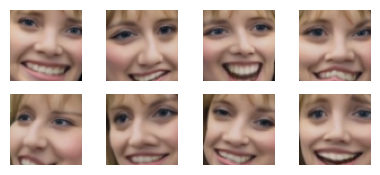

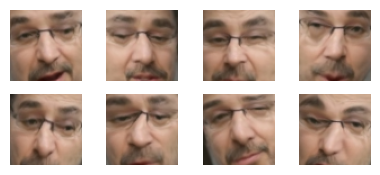

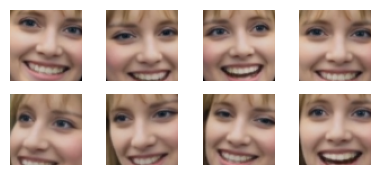

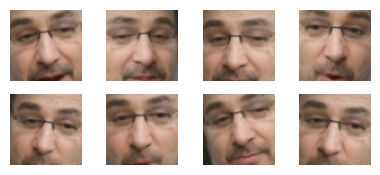

In [6]:
inspect(*next(iter(x)))

for i in next(iter(x)):
    subplots(i[:8], nc=4, sz=(4,2))

In [7]:
def _ConvLayer(input_features, output_features):
    return nn.Sequential(
        nn.Conv2d(input_features, output_features, kernel_size=5, stride=2, padding=2),
        nn.LeakyReLU(0.1, inplace=True)
    )

def _UpScale(input_features, output_features):
    return nn.Sequential(
        nn.ConvTranspose2d(input_features, output_features, kernel_size=2, stride=2, padding=0),
        nn.LeakyReLU(0.1, inplace=True)
    )

class Reshape(nn.Module):
    def forward(self, input):
        output = input.view(-1, 1024, 4, 4) # channel * 4 * 4
        return output

In [8]:
class Autoencoder(nn.Module):
    def __init__(self):
        super(Autoencoder, self).__init__()

        self.encoder = nn.Sequential(
            _ConvLayer(3, 128),
            _ConvLayer(128, 256),
            _ConvLayer(256, 512),
            _ConvLayer(512, 1024),
            nn.Flatten(),
            nn.Linear(1024 * 4 * 4, 1024),
            nn.Linear(1024, 1024 * 4 * 4),
            Reshape(),
            _UpScale(1024, 512),
        )

        self.decoder_A = nn.Sequential(
            _UpScale(512, 256),
            _UpScale(256, 128),
            _UpScale(128, 64),
            nn.Conv2d(64, 3, kernel_size=3, padding=1),
            nn.Sigmoid(),
        )

        self.decoder_B = nn.Sequential(
            _UpScale(512, 256),
            _UpScale(256, 128),
            _UpScale(128, 64),
            nn.Conv2d(64, 3, kernel_size=3, padding=1),
            nn.Sigmoid(),
        )

    def forward(self, x, select='A'):
        if select == 'A':
            out = self.encoder(x)
            out = self.decoder_A(out)
        else:
            out = self.encoder(x)
            out = self.decoder_B(out)
        return out

In [9]:
from torchsummary import summary
model = Autoencoder()
summary(model, torch.zeros(32,3,64,64), 'A');

Layer (type:depth-idx)                   Output Shape              Param #
├─Sequential: 1-1                        [-1, 512, 8, 8]           --
|    └─Sequential: 2-1                   [-1, 128, 32, 32]         --
|    |    └─Conv2d: 3-1                  [-1, 128, 32, 32]         9,728
|    |    └─LeakyReLU: 3-2               [-1, 128, 32, 32]         --
|    └─Sequential: 2-2                   [-1, 256, 16, 16]         --
|    |    └─Conv2d: 3-3                  [-1, 256, 16, 16]         819,456
|    |    └─LeakyReLU: 3-4               [-1, 256, 16, 16]         --
|    └─Sequential: 2-3                   [-1, 512, 8, 8]           --
|    |    └─Conv2d: 3-5                  [-1, 512, 8, 8]           3,277,312
|    |    └─LeakyReLU: 3-6               [-1, 512, 8, 8]           --
|    └─Sequential: 2-4                   [-1, 1024, 4, 4]          --
|    |    └─Conv2d: 3-7                  [-1, 1024, 4, 4]          13,108,224
|    |    └─LeakyReLU: 3-8               [-1, 1024, 4, 4]     

In [10]:
def train_batch(model, data, criterion, optimizes):
    optA, optB = optimizers
    optA.zero_grad()
    optB.zero_grad()
    imgA, imgB, targetA, targetB = data
    _imgA, _imgB = model(imgA, 'A'), model(imgB, 'B')

    lossA = criterion(_imgA, targetA)
    lossB = criterion(_imgB, targetB)

    lossA.backward()
    lossB.backward()

    optA.step()
    optB.step()

    return lossA.item(), lossB.item()

In [11]:
model = Autoencoder().to(device)

dataset = ImageDataset(Glob('cropped_faces_personA'), Glob('cropped_faces_personB'))
dataloader = DataLoader(dataset, 32, collate_fn=dataset.collate_fn)

optimizers = optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_A.parameters()}],
                        lr=5e-5, betas=(0.5, 0.999)), \
             optim.Adam([{'params': model.encoder.parameters()},
                          {'params': model.decoder_B.parameters()}],
                        lr=5e-5, betas=(0.5, 0.999))

criterion = nn.L1Loss()

EPOCH: 1.000  lossB: 0.147  lossA: 0.138  (1.88s - 1876.44s remaining)
EPOCH: 2.000  lossB: 0.146  lossA: 0.138  (2.86s - 1424.78s remaining)
EPOCH: 3.000  lossB: 0.145  lossA: 0.137  (3.85s - 1278.43s remaining)
EPOCH: 4.000  lossB: 0.130  lossA: 0.119  (4.83s - 1203.16s remaining)
EPOCH: 5.000  lossB: 0.113  lossA: 0.102  (5.83s - 1159.38s remaining)
EPOCH: 6.000  lossB: 0.106  lossA: 0.096  (6.96s - 1152.94s remaining)
EPOCH: 7.000  lossB: 0.107  lossA: 0.098  (8.23s - 1167.24s remaining)
EPOCH: 8.000  lossB: 0.104  lossA: 0.097  (9.34s - 1158.64s remaining)
EPOCH: 9.000  lossB: 0.102  lossA: 0.091  (10.34s - 1138.22s remaining)
EPOCH: 10.000  lossB: 0.102  lossA: 0.093  (11.31s - 1119.59s remaining)
EPOCH: 11.000  lossB: 0.103  lossA: 0.091  (12.28s - 1103.68s remaining)
EPOCH: 12.000  lossB: 0.100  lossA: 0.090  (13.25s - 1090.65s remaining)
EPOCH: 13.000  lossB: 0.099  lossA: 0.091  (14.21s - 1079.06s remaining)
EPOCH: 14.000  lossB: 0.098  lossA: 0.086  (15.19s - 1070.12s remain

══════════════════════════════A TO B══════════════════════════════

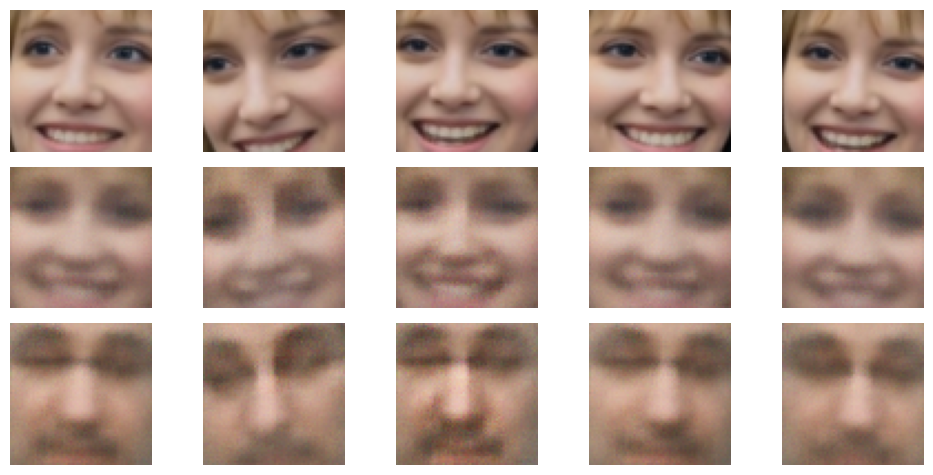

══════════════════════════════B TO A══════════════════════════════

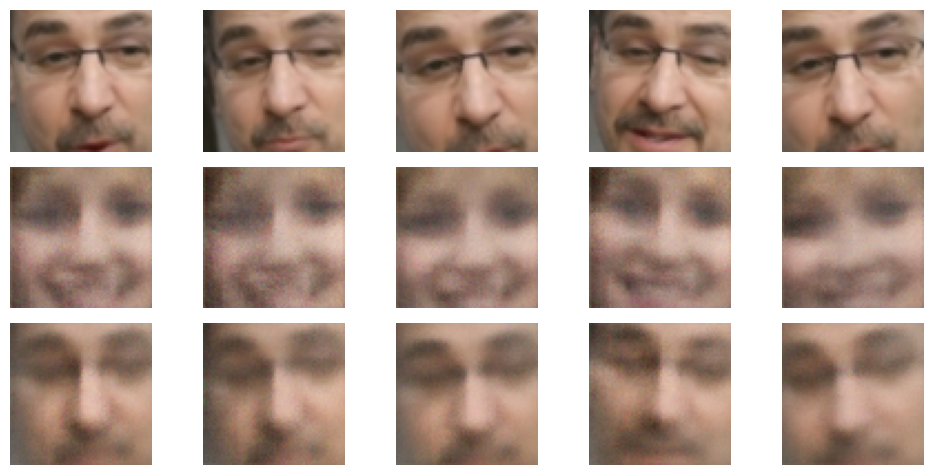

EPOCH: 101.000  lossB: 0.051  lossA: 0.060  (109.32s - 973.03s remaining)
EPOCH: 102.000  lossB: 0.052  lossA: 0.061  (110.60s - 973.70s remaining)
EPOCH: 103.000  lossB: 0.050  lossA: 0.062  (111.88s - 974.33s remaining)
EPOCH: 104.000  lossB: 0.052  lossA: 0.060  (112.90s - 972.64s remaining)
EPOCH: 105.000  lossB: 0.050  lossA: 0.061  (113.91s - 970.95s remaining)
EPOCH: 106.000  lossB: 0.051  lossA: 0.062  (114.94s - 969.44s remaining)
EPOCH: 107.000  lossB: 0.053  lossA: 0.060  (115.97s - 967.84s remaining)
EPOCH: 108.000  lossB: 0.050  lossA: 0.057  (116.98s - 966.20s remaining)
EPOCH: 109.000  lossB: 0.049  lossA: 0.061  (118.02s - 964.72s remaining)
EPOCH: 110.000  lossB: 0.052  lossA: 0.062  (119.04s - 963.14s remaining)
EPOCH: 111.000  lossB: 0.049  lossA: 0.057  (120.06s - 961.55s remaining)
EPOCH: 112.000  lossB: 0.051  lossA: 0.060  (121.12s - 960.32s remaining)
EPOCH: 113.000  lossB: 0.049  lossA: 0.060  (122.22s - 959.38s remaining)
EPOCH: 114.000  lossB: 0.053  lossA: 0

══════════════════════════════A TO B══════════════════════════════

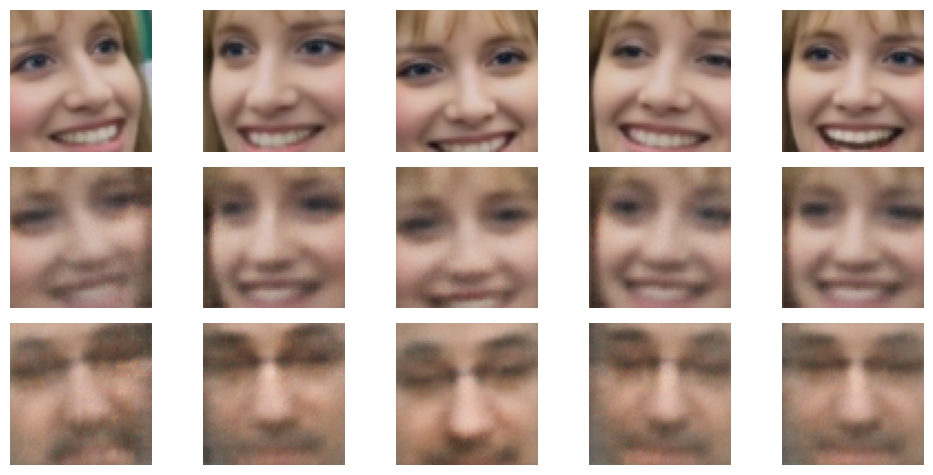

══════════════════════════════B TO A══════════════════════════════

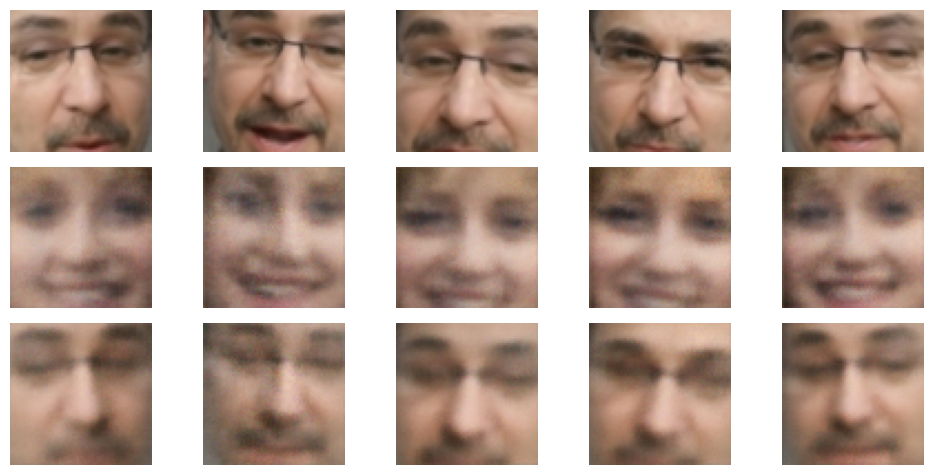

EPOCH: 201.000  lossB: 0.039  lossA: 0.047  (225.72s - 897.26s remaining)
EPOCH: 202.000  lossB: 0.042  lossA: 0.046  (227.01s - 896.81s remaining)
EPOCH: 203.000  lossB: 0.039  lossA: 0.048  (228.11s - 895.60s remaining)
EPOCH: 204.000  lossB: 0.041  lossA: 0.049  (229.14s - 894.08s remaining)
EPOCH: 205.000  lossB: 0.040  lossA: 0.045  (230.21s - 892.75s remaining)
EPOCH: 206.000  lossB: 0.038  lossA: 0.046  (231.26s - 891.37s remaining)
EPOCH: 207.000  lossB: 0.039  lossA: 0.047  (232.31s - 889.96s remaining)
EPOCH: 208.000  lossB: 0.038  lossA: 0.048  (233.37s - 888.60s remaining)
EPOCH: 209.000  lossB: 0.039  lossA: 0.048  (234.41s - 887.17s remaining)
EPOCH: 210.000  lossB: 0.039  lossA: 0.046  (235.47s - 885.81s remaining)
EPOCH: 211.000  lossB: 0.039  lossA: 0.046  (236.53s - 884.47s remaining)
EPOCH: 212.000  lossB: 0.038  lossA: 0.045  (237.65s - 883.33s remaining)
EPOCH: 213.000  lossB: 0.039  lossA: 0.046  (238.94s - 882.85s remaining)
EPOCH: 214.000  lossB: 0.038  lossA: 0

══════════════════════════════A TO B══════════════════════════════

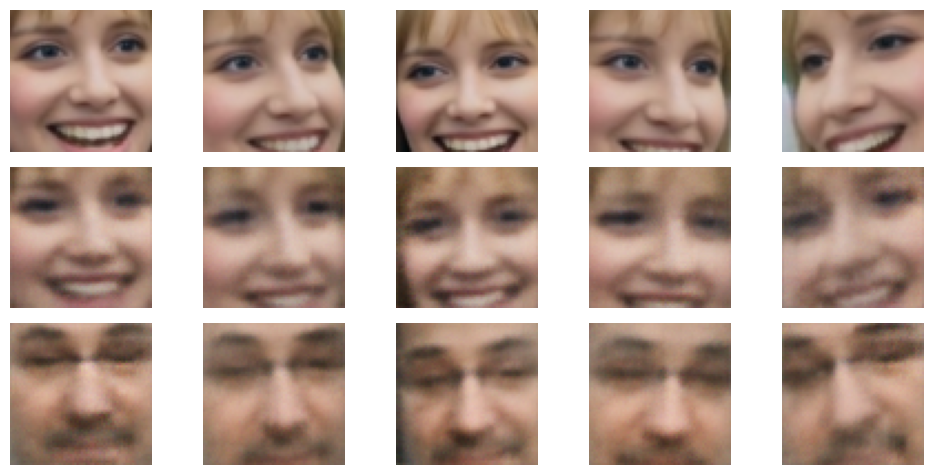

══════════════════════════════B TO A══════════════════════════════

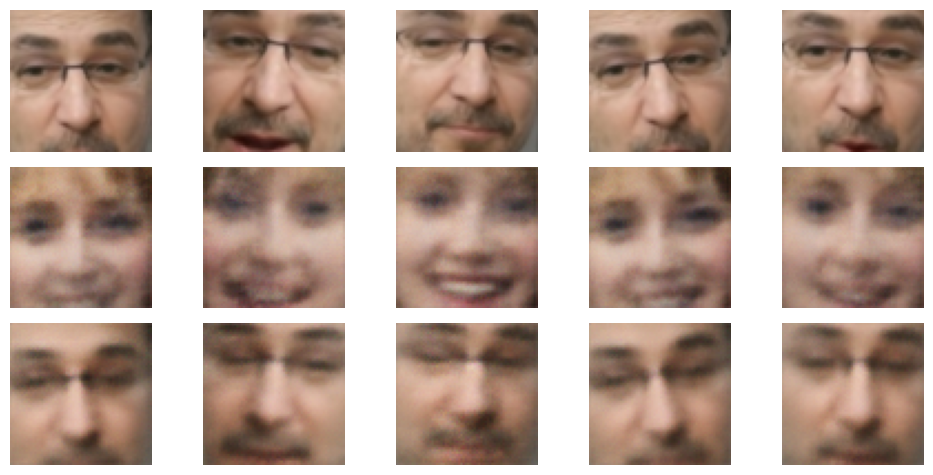

EPOCH: 301.000  lossB: 0.035  lossA: 0.043  (338.93s - 787.08s remaining)
EPOCH: 302.000  lossB: 0.035  lossA: 0.040  (339.99s - 785.80s remaining)
EPOCH: 303.000  lossB: 0.035  lossA: 0.041  (341.07s - 784.58s remaining)
EPOCH: 304.000  lossB: 0.034  lossA: 0.041  (342.39s - 783.90s remaining)
EPOCH: 305.000  lossB: 0.035  lossA: 0.040  (343.73s - 783.24s remaining)
EPOCH: 306.000  lossB: 0.035  lossA: 0.041  (344.88s - 782.17s remaining)
EPOCH: 307.000  lossB: 0.034  lossA: 0.041  (345.97s - 780.97s remaining)
EPOCH: 308.000  lossB: 0.035  lossA: 0.040  (347.03s - 779.70s remaining)
EPOCH: 309.000  lossB: 0.035  lossA: 0.041  (348.11s - 778.46s remaining)
EPOCH: 310.000  lossB: 0.036  lossA: 0.041  (349.18s - 777.20s remaining)
EPOCH: 311.000  lossB: 0.035  lossA: 0.040  (350.26s - 775.98s remaining)
EPOCH: 312.000  lossB: 0.035  lossA: 0.040  (351.31s - 774.69s remaining)
EPOCH: 313.000  lossB: 0.034  lossA: 0.039  (352.37s - 773.41s remaining)
EPOCH: 314.000  lossB: 0.035  lossA: 0

══════════════════════════════A TO B══════════════════════════════

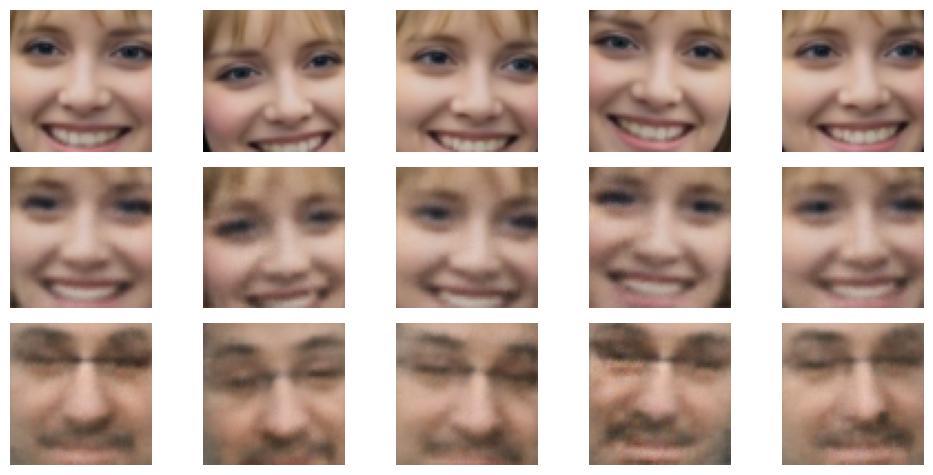

══════════════════════════════B TO A══════════════════════════════

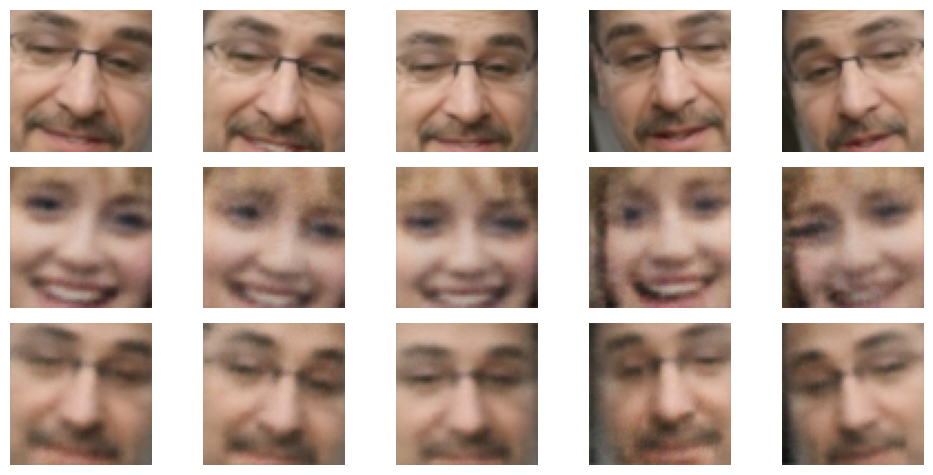

EPOCH: 401.000  lossB: 0.032  lossA: 0.036  (458.69s - 685.18s remaining)
EPOCH: 402.000  lossB: 0.032  lossA: 0.036  (459.78s - 683.96s remaining)
EPOCH: 403.000  lossB: 0.032  lossA: 0.037  (460.91s - 682.79s remaining)
EPOCH: 404.000  lossB: 0.031  lossA: 0.036  (462.23s - 681.90s remaining)
EPOCH: 405.000  lossB: 0.031  lossA: 0.036  (463.54s - 681.00s remaining)
EPOCH: 406.000  lossB: 0.032  lossA: 0.038  (464.59s - 679.73s remaining)
EPOCH: 407.000  lossB: 0.032  lossA: 0.036  (465.64s - 678.45s remaining)
EPOCH: 408.000  lossB: 0.032  lossA: 0.036  (466.72s - 677.20s remaining)
EPOCH: 409.000  lossB: 0.032  lossA: 0.036  (467.82s - 675.99s remaining)
EPOCH: 410.000  lossB: 0.031  lossA: 0.036  (468.90s - 674.76s remaining)
EPOCH: 411.000  lossB: 0.032  lossA: 0.037  (469.99s - 673.53s remaining)
EPOCH: 412.000  lossB: 0.032  lossA: 0.039  (471.06s - 672.29s remaining)
EPOCH: 413.000  lossB: 0.031  lossA: 0.037  (472.16s - 671.09s remaining)
EPOCH: 414.000  lossB: 0.032  lossA: 0

══════════════════════════════A TO B══════════════════════════════

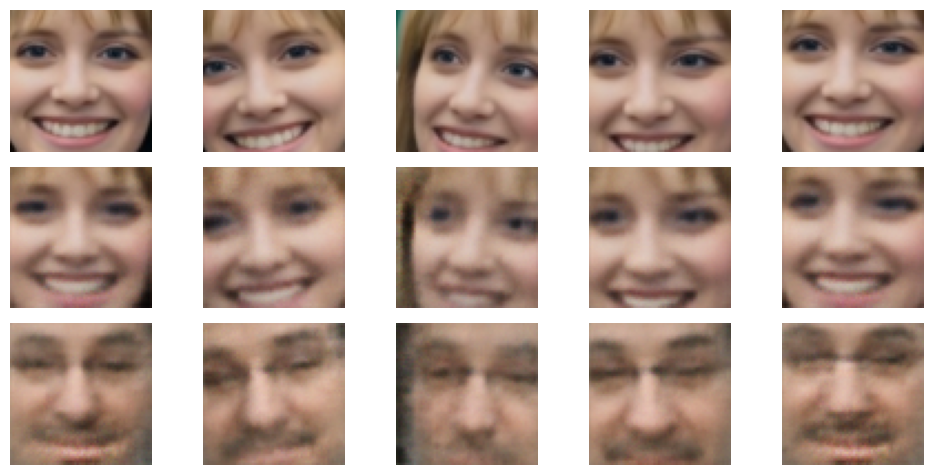

══════════════════════════════B TO A══════════════════════════════

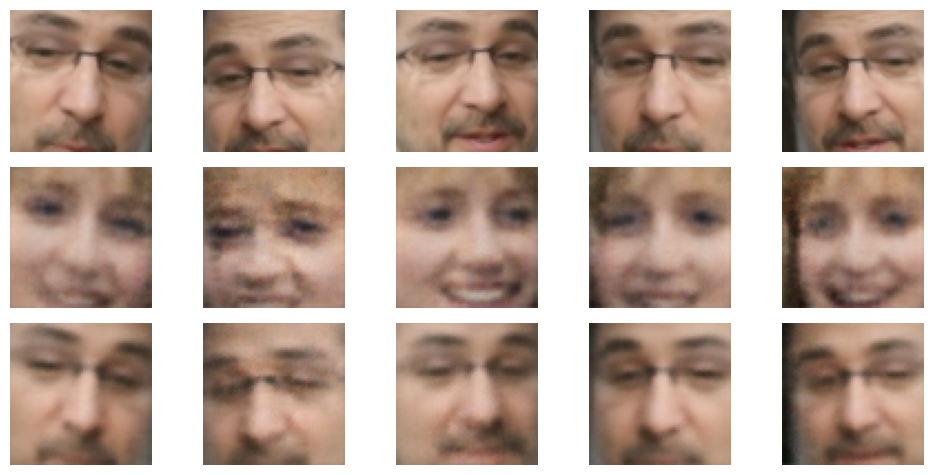

EPOCH: 501.000  lossB: 0.030  lossA: 0.033  (578.94s - 576.63s remaining)
EPOCH: 502.000  lossB: 0.029  lossA: 0.034  (580.28s - 575.66s remaining)
EPOCH: 503.000  lossB: 0.029  lossA: 0.037  (581.61s - 574.67s remaining)
EPOCH: 504.000  lossB: 0.029  lossA: 0.034  (582.72s - 573.47s remaining)
EPOCH: 505.000  lossB: 0.030  lossA: 0.034  (583.80s - 572.24s remaining)
EPOCH: 506.000  lossB: 0.030  lossA: 0.034  (584.89s - 571.02s remaining)
EPOCH: 507.000  lossB: 0.030  lossA: 0.034  (586.00s - 569.82s remaining)
EPOCH: 508.000  lossB: 0.031  lossA: 0.035  (587.08s - 568.59s remaining)
EPOCH: 509.000  lossB: 0.030  lossA: 0.034  (588.17s - 567.37s remaining)
EPOCH: 510.000  lossB: 0.029  lossA: 0.034  (589.26s - 566.15s remaining)
EPOCH: 511.000  lossB: 0.029  lossA: 0.035  (590.36s - 564.94s remaining)
EPOCH: 512.000  lossB: 0.028  lossA: 0.033  (591.45s - 563.73s remaining)
EPOCH: 513.000  lossB: 0.030  lossA: 0.034  (592.71s - 562.67s remaining)
EPOCH: 514.000  lossB: 0.029  lossA: 0

══════════════════════════════A TO B══════════════════════════════

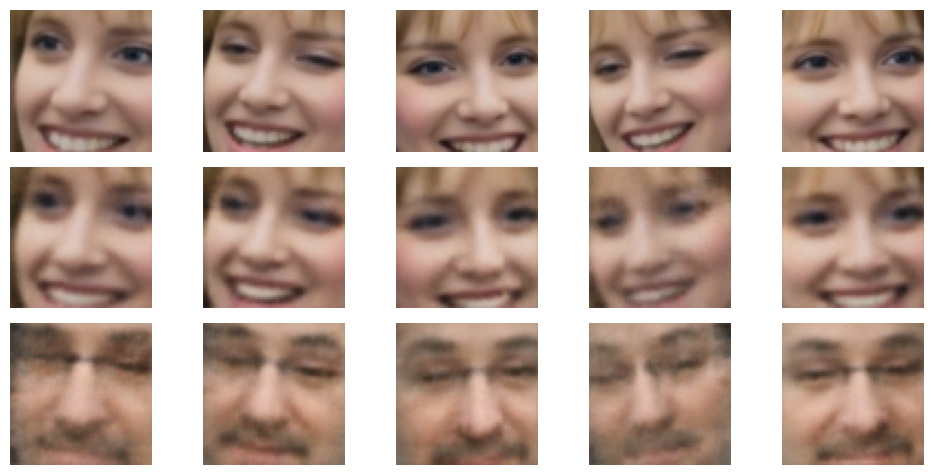

══════════════════════════════B TO A══════════════════════════════

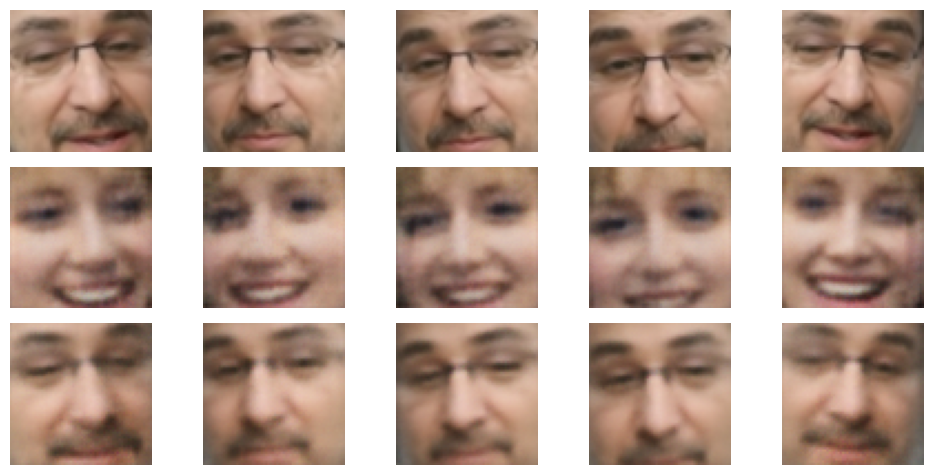

EPOCH: 601.000  lossB: 0.029  lossA: 0.031  (699.59s - 464.45s remaining)
EPOCH: 602.000  lossB: 0.027  lossA: 0.033  (700.86s - 463.36s remaining)
EPOCH: 603.000  lossB: 0.027  lossA: 0.031  (701.97s - 462.16s remaining)
EPOCH: 604.000  lossB: 0.028  lossA: 0.033  (703.07s - 460.95s remaining)
EPOCH: 605.000  lossB: 0.028  lossA: 0.032  (704.19s - 459.76s remaining)
EPOCH: 606.000  lossB: 0.029  lossA: 0.032  (705.30s - 458.56s remaining)
EPOCH: 607.000  lossB: 0.027  lossA: 0.033  (706.40s - 457.35s remaining)
EPOCH: 608.000  lossB: 0.029  lossA: 0.033  (707.52s - 456.16s remaining)
EPOCH: 609.000  lossB: 0.028  lossA: 0.032  (708.63s - 454.97s remaining)
EPOCH: 610.000  lossB: 0.028  lossA: 0.032  (709.73s - 453.76s remaining)
EPOCH: 611.000  lossB: 0.028  lossA: 0.031  (710.85s - 452.57s remaining)
EPOCH: 612.000  lossB: 0.027  lossA: 0.032  (712.12s - 451.47s remaining)
EPOCH: 613.000  lossB: 0.028  lossA: 0.032  (713.42s - 450.40s remaining)
EPOCH: 614.000  lossB: 0.028  lossA: 0

══════════════════════════════A TO B══════════════════════════════

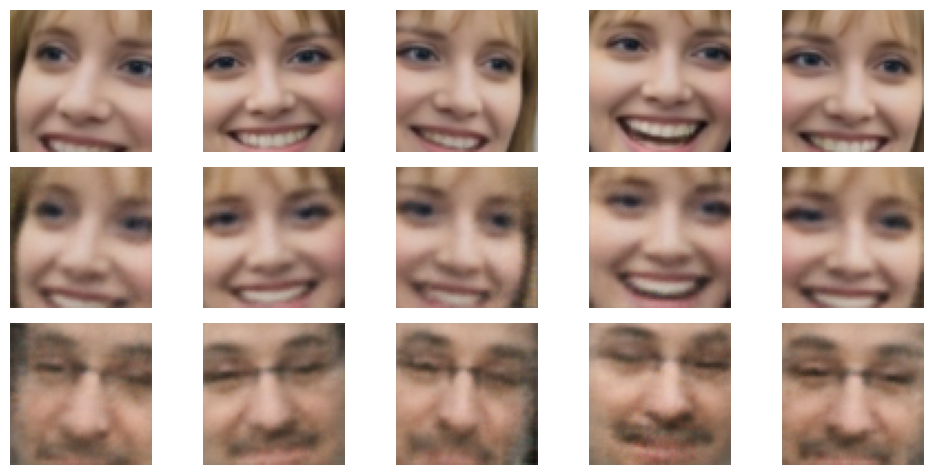

══════════════════════════════B TO A══════════════════════════════

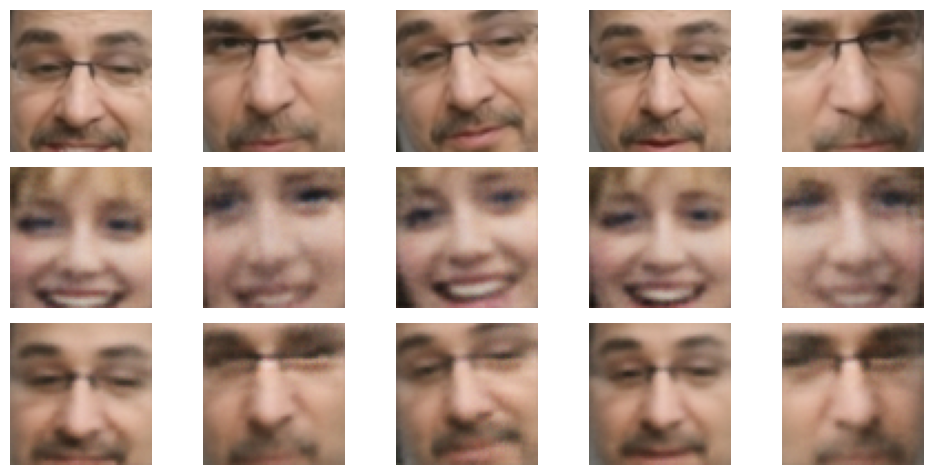

EPOCH: 701.000  lossB: 0.027  lossA: 0.031  (819.30s - 349.46s remaining)
EPOCH: 702.000  lossB: 0.026  lossA: 0.030  (820.62s - 348.36s remaining)
EPOCH: 703.000  lossB: 0.027  lossA: 0.030  (821.80s - 347.19s remaining)
EPOCH: 704.000  lossB: 0.027  lossA: 0.029  (822.95s - 346.01s remaining)
EPOCH: 705.000  lossB: 0.026  lossA: 0.030  (824.07s - 344.82s remaining)
EPOCH: 706.000  lossB: 0.028  lossA: 0.032  (825.16s - 343.62s remaining)
EPOCH: 707.000  lossB: 0.026  lossA: 0.030  (826.26s - 342.42s remaining)
EPOCH: 708.000  lossB: 0.027  lossA: 0.031  (827.36s - 341.23s remaining)
EPOCH: 709.000  lossB: 0.026  lossA: 0.030  (828.45s - 340.03s remaining)
EPOCH: 710.000  lossB: 0.027  lossA: 0.030  (829.55s - 338.83s remaining)
EPOCH: 711.000  lossB: 0.027  lossA: 0.031  (830.66s - 337.64s remaining)
EPOCH: 712.000  lossB: 0.027  lossA: 0.030  (831.96s - 336.52s remaining)
EPOCH: 713.000  lossB: 0.027  lossA: 0.031  (833.24s - 335.40s remaining)
EPOCH: 714.000  lossB: 0.026  lossA: 0

══════════════════════════════A TO B══════════════════════════════

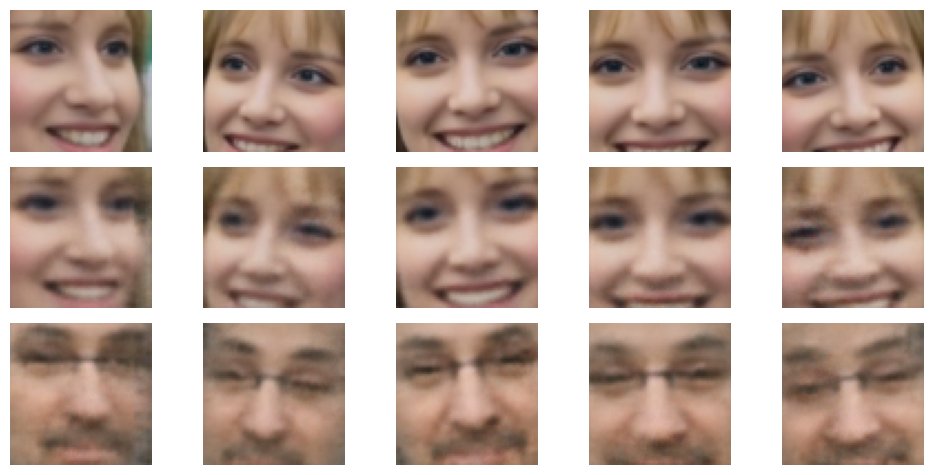

══════════════════════════════B TO A══════════════════════════════

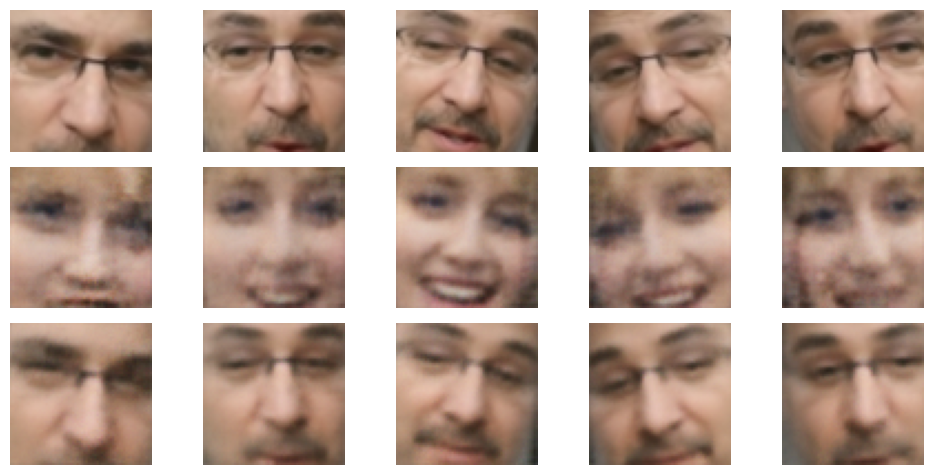

EPOCH: 801.000  lossB: 0.025  lossA: 0.028  (939.43s - 233.39s remaining)
EPOCH: 802.000  lossB: 0.026  lossA: 0.031  (940.73s - 232.25s remaining)
EPOCH: 803.000  lossB: 0.026  lossA: 0.029  (942.03s - 231.11s remaining)
EPOCH: 804.000  lossB: 0.025  lossA: 0.029  (943.24s - 229.95s remaining)
EPOCH: 805.000  lossB: 0.027  lossA: 0.030  (944.37s - 228.76s remaining)
EPOCH: 806.000  lossB: 0.025  lossA: 0.028  (945.50s - 227.58s remaining)
EPOCH: 807.000  lossB: 0.027  lossA: 0.032  (946.62s - 226.39s remaining)
EPOCH: 808.000  lossB: 0.026  lossA: 0.032  (947.75s - 225.21s remaining)
EPOCH: 809.000  lossB: 0.027  lossA: 0.030  (948.87s - 224.02s remaining)
EPOCH: 810.000  lossB: 0.024  lossA: 0.029  (950.01s - 222.84s remaining)
EPOCH: 811.000  lossB: 0.026  lossA: 0.029  (951.14s - 221.66s remaining)
EPOCH: 812.000  lossB: 0.026  lossA: 0.030  (952.28s - 220.48s remaining)
EPOCH: 813.000  lossB: 0.027  lossA: 0.030  (953.60s - 219.34s remaining)
EPOCH: 814.000  lossB: 0.026  lossA: 0

══════════════════════════════A TO B══════════════════════════════

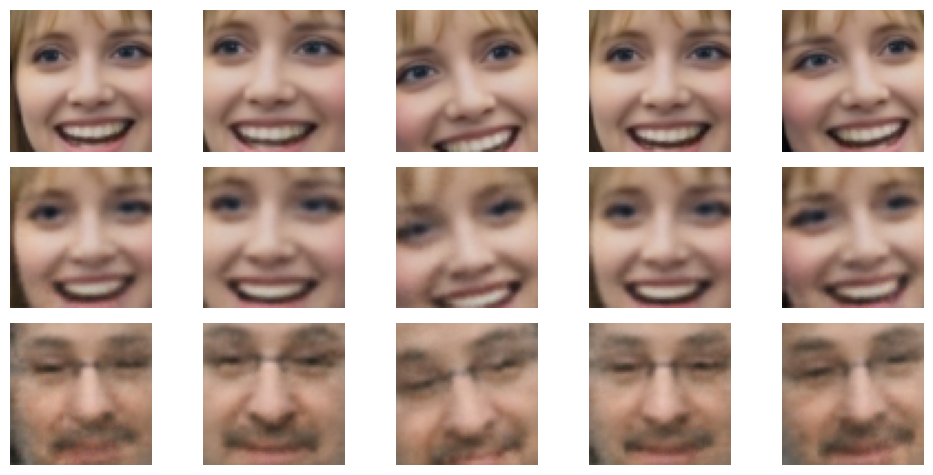

══════════════════════════════B TO A══════════════════════════════

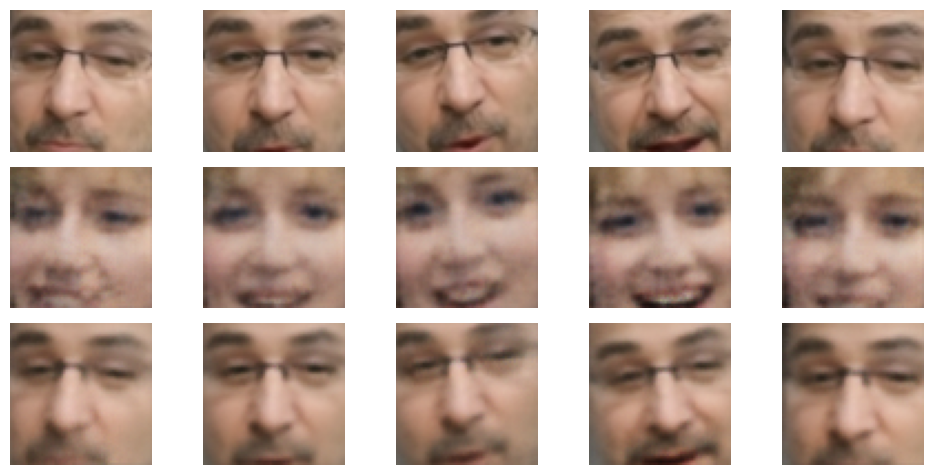

EPOCH: 901.000  lossB: 0.024  lossA: 0.028  (1059.28s - 116.39s remaining)
EPOCH: 902.000  lossB: 0.024  lossA: 0.028  (1060.39s - 115.21s remaining)
EPOCH: 903.000  lossB: 0.025  lossA: 0.029  (1061.68s - 114.05s remaining)
EPOCH: 904.000  lossB: 0.025  lossA: 0.028  (1063.02s - 112.89s remaining)
EPOCH: 905.000  lossB: 0.024  lossA: 0.029  (1064.33s - 111.73s remaining)
EPOCH: 906.000  lossB: 0.025  lossA: 0.028  (1065.50s - 110.55s remaining)
EPOCH: 907.000  lossB: 0.025  lossA: 0.029  (1066.61s - 109.37s remaining)
EPOCH: 908.000  lossB: 0.024  lossA: 0.028  (1067.73s - 108.18s remaining)
EPOCH: 909.000  lossB: 0.025  lossA: 0.028  (1068.83s - 107.00s remaining)
EPOCH: 910.000  lossB: 0.024  lossA: 0.028  (1069.94s - 105.82s remaining)
EPOCH: 911.000  lossB: 0.025  lossA: 0.029  (1071.06s - 104.64s remaining)
EPOCH: 912.000  lossB: 0.025  lossA: 0.030  (1072.19s - 103.46s remaining)
EPOCH: 913.000  lossB: 0.025  lossA: 0.027  (1073.30s - 102.28s remaining)
EPOCH: 914.000  lossB: 0.

══════════════════════════════A TO B══════════════════════════════

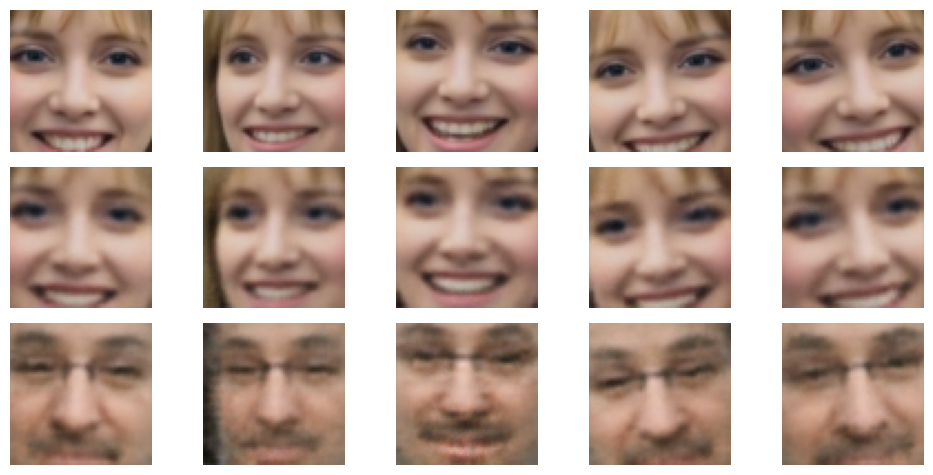

══════════════════════════════B TO A══════════════════════════════

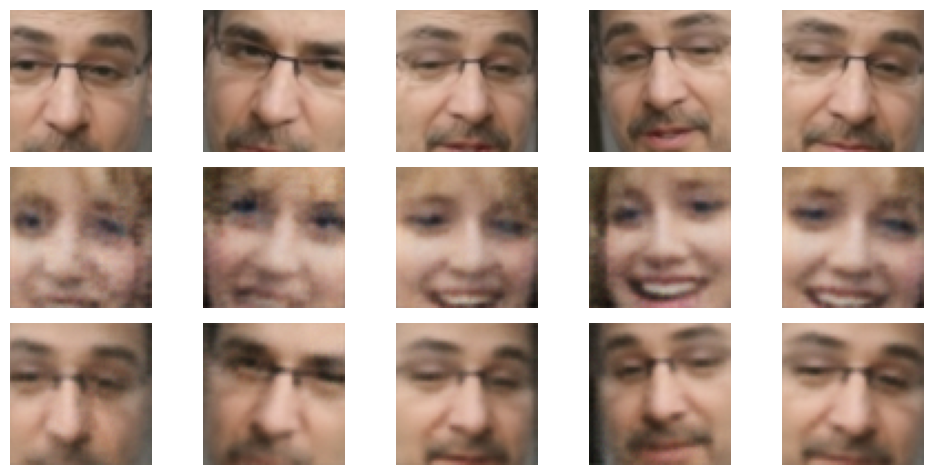

100%|██████████| 1101/1101 [00:01<00:00, 563.22it/s]


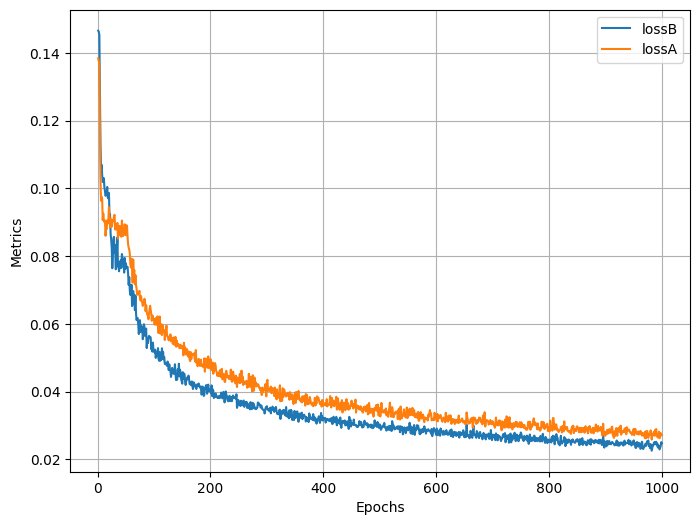

In [12]:
n_epochs = 1000
log = Report(n_epochs)
!mkdir checkpoint
for ex in range(n_epochs):
    N = len(dataloader)
    for bx,data in enumerate(dataloader):
        lossA, lossB = train_batch(model, data, criterion, optimizers)
        log.record(ex+(1+bx)/N, lossA=lossA, lossB=lossB, end='\r')

    log.report_avgs(ex+1)
    if (ex+1)%100 == 0:
        state = {
                'state': model.state_dict(),
                'epoch': ex
            }
        torch.save(state, './checkpoint/autoencoder.pth')

    if (ex+1)%100 == 0:
        bs = 5
        a,b,A,B = data
        line('A to B')
        _a = model(a[:bs], 'A')
        _b = model(a[:bs], 'B')
        x = torch.cat([A[:bs],_a,_b])
        subplots(x, nc=bs, figsize=(bs*2, 5))

        line('B to A')
        _a = model(b[:bs], 'A')
        _b = model(b[:bs], 'B')
        x = torch.cat([B[:bs],_a,_b])
        subplots(x, nc=bs, figsize=(bs*2, 5))

log.plot_epochs()

---